<div class="alert alert-block alert-dark">

## <center> Group Project - ABCDEATS Customer Segmentation </center> <br>
#  <center> <b> Hybrid Hierarchical-K-means clustering </center> <br>
## <center> Master Data Science and Advanced Analytics <center>
## <center> Fall Semester 2024-2025 <center>
<br>
<center> Group 36: <center> <br>
<center>Eduardo Mendes, 20240850  <br><center>
<center>Joana Esteves, 20240746 <br><center>
<center>João Afonso Freire, 20240528 <br><center>
<center>Tomás Figueiredo, 20240941  <br><center>

<div>

**Description of contents:**
- Apply hierarquical clustering, experiment with different linkage methods and k values.
- Optimize solution with K-means, using centroids and k from hierarquical clustering.
- Assess cluster quality using silhouette score and silhouette plot.
- Visualize the cluster assignment results using PCA.
- Assign cluster for outliers removed in preprocessing.
- Analyze the contribution of each segmentations feature.
- Profiling of each cluster, using visualizations for both numeric and categoric features.


**Table of Contents:**

- [1. Imports](#imports)

    - [1.1. Import the needed Libraries](#importlibraries)

    - [1.2. Import Dataset](#importdataset)

- [2. Hierarchical Clustering](#hierarcluster)

    - [2.1. Define K and linkage method](#klinkage)

    - [2.2. PCA and visualizations](#pcavis)

    - [2.3. Dendogram](#dendogram)

- [3. Optimization: K-means](#optkmeans)

    - [3.1. K-means w/ hierarchical centroids and k](#kmeanswhierarc)

        - [3.1.1. Cluster quality](#clusterquality)

    - [3.2. PCA and visualizations for optimization results](#pcavisopt)

    - [3.3. Outliers](#outliers)

    - [3.4. Segmentation features importance](#segfeat)

- [4. Profiling](#profiling)

    - [4.1. Numeric features](#numfeatures)

        - [4.1.1. Grouped bar charts](#groupedbarcharts)

        - [4.1.2. Boxplots](#boxplots)

        - [4.1.3. Heatmaps median and mean](#heatmapsmedian)

        - [4.1.4. Scatter plots - pairwise by cluster](#scatterplots)

    - [4.2. Categoric features](#catfeatures)

        - [4.2.1. Stacked bar plot](#stackedbarplot)

        - [4.2.2. Heatmaps relative frequency](#heatmaprelfreq)


<a class="anchor" id="imports">

# **1. Imports**

</a>


<a class="anchor" id="importlibraries">

## 1.1. Import the needed Libraries

</a>
    


In [2]:
%pip install pyarrow
%pip install scikit-posthocs

import pandas as pd
import numpy as np

# Plots
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches
import plotly.express as px

# Feature importance
from scipy.stats import kruskal
import scikit_posthocs as sp

# Evaluation metric
from sklearn.metrics import silhouette_score, silhouette_samples

# Hirarquical clustering
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# K-means clustering
from sklearn.cluster import KMeans

# Warnings
import warnings

sns.set()


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Style and palette configuration
sns.set_theme(style="whitegrid")
palette = sns.color_palette("tab20", n_colors=24)

In [4]:
# Disable warnings
warnings.filterwarnings('ignore')

<a class="anchor" id="importlibraries">

## 1.2. Import Dataset

</a>

In [5]:
df = pd.read_parquet('Data_original_values.parquet')

In [6]:
df_preprocessed = pd.read_parquet('Data_preprocessed.parquet')

In [7]:
# Check first lines to see if it loaded correctly
df_preprocessed.head()

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,...,cuisine_diversity,vendor_loyalty,customer_region,last_promo,payment_method,age_group,use_promo,weekend_preference,meal_time_preference,cuisine_preference
customer_id,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,-1.349452,-0.389077,0.040521,-0.512036,-1.206775,-2.662974,-0.460767,-0.478193,-0.314716,-0.159471,...,-0.870187,0.673444,2360,DELIVERY,DIGI,young,True,True,dinner,CUI_Indian
5d272b9dcb,-1.491482,-0.389077,-0.625394,-0.164197,-1.206775,-2.662974,0.889569,-0.138681,-0.314716,-0.159471,...,-0.148134,0.673444,8670,DISCOUNT,DIGI,young,True,True,breakfast,CUI_American
f6d1b2ba63,1.491139,-0.824297,-0.625394,-0.164197,-1.206775,-2.662974,0.508273,-0.478193,-0.314716,-0.159471,...,-0.870187,-1.623501,4660,DISCOUNT,CASH,adult,True,True,breakfast,CUI_American
180c632ed8,0.070843,-0.389077,-0.403423,-0.512036,-1.206775,-2.619989,-0.460767,0.249713,-0.314716,-0.159471,...,-0.148134,0.673444,4660,DELIVERY,DIGI,adult,True,False,lunch,CUI_Indian
4eb37a6705,-1.065393,-0.389077,0.040521,-0.859876,-1.206775,-2.619989,1.073897,1.693303,-0.314716,-0.159471,...,-0.148134,0.673444,4660,No Promo Code,DIGI,young,False,False,breakfast,CUI_Asian


<a class="anchor" id="hirarcluster">

# **2. Hierarchical Clustering**

</a>

<a class="anchor" id="klinkage">

## 2.1. Define K and linkage method

</a>

In [8]:
# Select segmentation features

segmentation_features = ["total_orders", 'avg_spent_per_order', 'vendor_loyalty', "order_frequency"]


Analyze silhouette score for different linkage methods and k:

In [9]:
def get_silhouette_hc(df, link_method, max_nclus, min_nclus=2, dist="euclidean"):
    """
    Computes the Silhouette Score for a range of cluster solutions using hierarchical clustering.

    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): Linkage method ("ward", "complete", "average", "single")
    max_nclus (int): Maximum number of clusters to compare the methods
    min_nclus (int): Minimum number of clusters to compare the methods (defaults to 2, as Silhouette requires at least 2 clusters)
    dist (str): Distance metric to use (must be valid for AgglomerativeClustering). Defaults to "euclidean".

    Returns:
    ndarray: Silhouette scores for the range of cluster solutions
    """
    
    silhouette_scores = []  
    
    for i in range(min_nclus, max_nclus + 1):  
        cluster = AgglomerativeClustering(n_clusters=i, metric=dist, linkage=link_method)
        
        hclabels = cluster.fit_predict(df)
        
        score = silhouette_score(df, hclabels, metric=dist)
        silhouette_scores.append(score)
    
    return np.array(silhouette_scores)

In [10]:
hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

# Compute Silhouette Scores for each linkage method and k
silhouette_hc = np.vstack([
    get_silhouette_hc(df_preprocessed[segmentation_features], 
                      link_method=link, 
                      max_nclus=max_nclus, 
                      min_nclus=2,  # Silhouette requires at least 2 clusters
                      dist="euclidean") 
    for link in hc_methods
]) 

In [11]:
# DataFrame to store Silhouette Scores for each linkage method and k
silhouette_hc_methods = pd.DataFrame(
    silhouette_hc.T,  
    index=range(2, max_nclus + 1),  # Cluster range from 2 to 10
    columns=hc_methods  # Linkage methods 
)

# Display results
print(silhouette_hc_methods)

        ward  complete   average    single
2   0.395183  0.474073  0.621668  0.645367
3   0.370429  0.277831  0.605773  0.608936
4   0.376762  0.281835  0.432614  0.587048
5   0.394332  0.241765  0.429606  0.575765
6   0.354461  0.230540  0.338740  0.575453
7   0.354680  0.225117  0.305226  0.549926
8   0.347571  0.235532  0.279620  0.487245
9   0.352513  0.235583  0.277488  0.444134
10  0.366524  0.230452  0.254470  0.385760


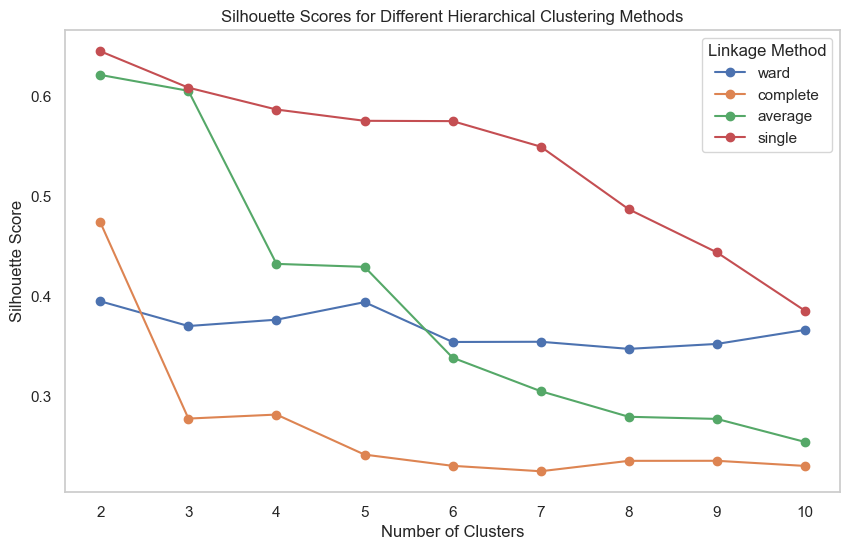

In [12]:
# Plot scores vs. k vs. linkage method

plt.figure(figsize=(10, 6))

for method in hc_methods:
    plt.plot(silhouette_hc_methods.index, silhouette_hc_methods[method], marker="o", label=method)

plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different Hierarchical Clustering Methods")
plt.legend(title="Linkage Method")
plt.grid()
plt.show()

- The linkage method that achieves the best score is single.
- We need to further analyze if the clusters are balanced.

In [13]:
# HC w/ single linkage
hclust_single = AgglomerativeClustering(linkage='single', metric='euclidean', n_clusters=3)
hc_labels_single = hclust_single.fit_predict(df_preprocessed[segmentation_features]) 
hc_labels_single

array([0, 0, 0, ..., 0, 0, 0])

In [14]:
# Count unique observations in each cluster
unique, counts = np.unique(hc_labels_single, return_counts=True)
cluster_counts = dict(zip(unique, counts))

# Show results
print("Number of observations for each cluster - single linkage")
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster}: {count} observations")

Number of observations for each cluster - single linkage
Cluster 0: 30209 observations
Cluster 1: 1 observations
Cluster 2: 1 observations


- Single linkage is grouping the majority of observations in the same cluster. It's very imbalanced.

In [15]:
# Performing HC
hclust_avg = AgglomerativeClustering(linkage='average', metric='euclidean', n_clusters=3)
hc_labels_avg = hclust_avg.fit_predict(df_preprocessed[segmentation_features]) 
hc_labels_avg

array([0, 0, 0, ..., 0, 0, 0])

In [16]:
# Count unique observations in each cluster
unique, counts = np.unique(hc_labels_avg, return_counts=True)
cluster_counts = dict(zip(unique, counts))

# Show results
print("Number of observations for each cluster - average linkage")
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster}: {count} observations")

Number of observations for each cluster - average linkage
Cluster 0: 30194 observations
Cluster 1: 2 observations
Cluster 2: 15 observations


- Average linkage also groups the majority of observations in one cluster and is very imbalanced.

In [17]:
# Performing HC
hclust_ward = AgglomerativeClustering(linkage='ward', metric='euclidean', n_clusters=5)
hc_labels_ward = hclust_ward.fit_predict(df_preprocessed[segmentation_features]) 
hc_labels_ward

array([4, 4, 1, ..., 2, 4, 4])

In [18]:
# Count unique observations in each cluster
unique, counts = np.unique(hc_labels_ward, return_counts=True)
cluster_counts = dict(zip(unique, counts))

# Show results
print("Number of observations for each cluster - ward linkage")
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster}: {count} observations")

Number of observations for each cluster - ward linkage
Cluster 0: 12177 observations
Cluster 1: 8537 observations
Cluster 2: 2496 observations
Cluster 3: 2061 observations
Cluster 4: 4940 observations


- Ward linkage has a lower score but results are more balanced. The best score for k=5 is: 0.394.

<a class="anchor" id="pcavis">

## 2.2. PCA and visualizations

</a>

PCA to reduce the selected segmentation features to 2 components, for visualization of results:

In [19]:
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_preprocessed[segmentation_features])
df_pca_with_labels = pd.DataFrame(df_pca, columns=["PC1", "PC2"])
df_pca_with_labels["Cluster"] = hc_labels_ward

In [20]:
loadings = pd.DataFrame(
    pca.components_.T, 
    columns=[f"PC{i+1}" for i in range(pca.n_components_)],
    index=segmentation_features
)

print("Principal Component Loadings:")
print(loadings)


Principal Component Loadings:
                          PC1       PC2
total_orders         0.566143  0.250811
avg_spent_per_order -0.377247  0.892746
vendor_loyalty      -0.528921 -0.374245
order_frequency     -0.507356  0.006219


- PC1: general component, mostly total orders, loyalty and order frequency.
- PC2: mostly related to average spent per order.

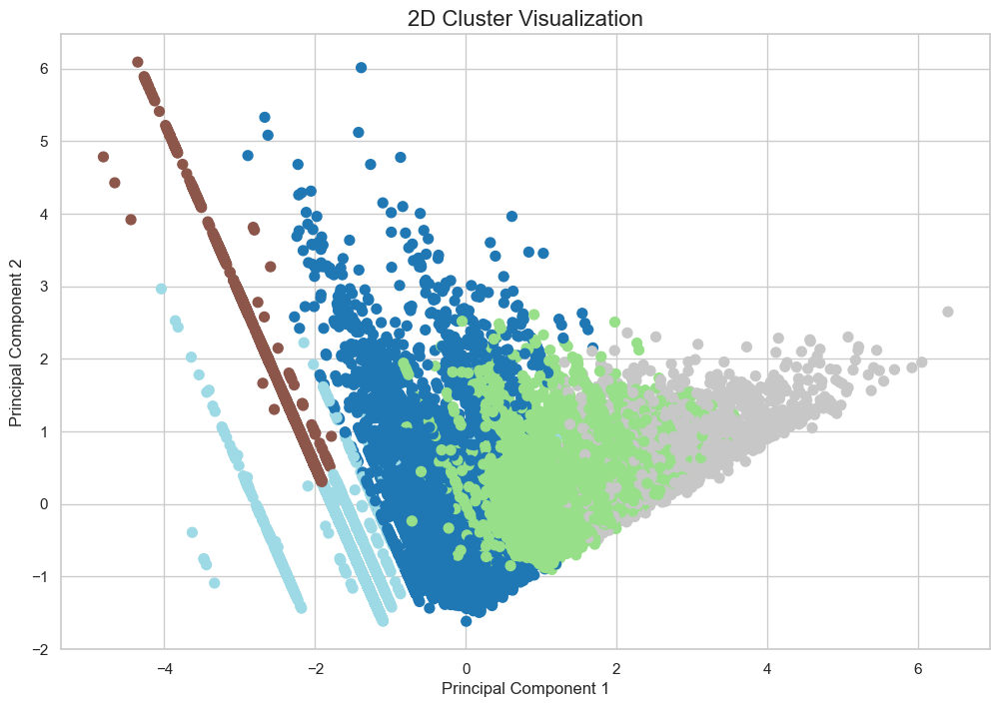

In [21]:
plt.figure(figsize=(12, 8))

scatter = plt.scatter(
    df_pca_with_labels["PC1"], 
    df_pca_with_labels["PC2"], 
    c=df_pca_with_labels["Cluster"], 
    cmap="tab20", 
    s=50
)

plt.title("2D Cluster Visualization", fontsize=16)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid(True)

plt.show()


- The visualizations shows there is no clear division between the clusters, there are some overlapped points between clusters.
- The visualizations and low score indicate that the results can be improved. 

<a class="anchor" id="dendogram">

## 2.3. Dendogram

</a>

Check Dendogram:

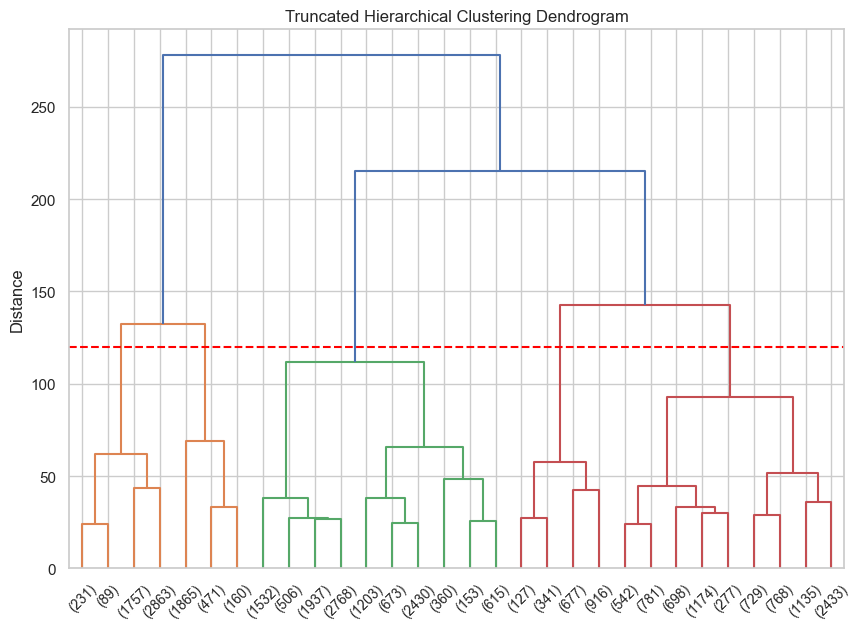

In [22]:
# Compute linkage matrix
Z = linkage(df_preprocessed[segmentation_features], method='ward')

plt.figure(figsize=(10, 7))
dendrogram(Z, truncate_mode='lastp', p=30)  # Truncate to show only the last 30 clusters
plt.title("Truncated Hierarchical Clustering Dendrogram")
plt.ylabel("Distance")
plt.axhline(y=120, color='red', linestyle='--', linewidth=1.5)
plt.show()

- The Dendogram indicates 5 clusters for a the threshold distance of 120.

<a class="anchor" id="optkmeans">

# **3. Optimization: K-means**

</a>

<a class="anchor" id="kmeanswhierarc">

## 3.1. K-means w/ hierarchical centroids and k

</a>

In [23]:
k = 5

# Compute centroids from AgglomerativeClustering labels
centroids = np.array([
    df_preprocessed[segmentation_features][hc_labels_ward == i].mean(axis=0)
    for i in range(k)
])

In [24]:
# Initialize K-means with the centroids from AgglomerativeClustering

kmeans = KMeans(n_clusters=k, max_iter=1000, tol=1e-10, init=centroids, n_init=1, random_state=42)

kmeans_labels = kmeans.fit_predict(df_preprocessed[segmentation_features])

In [25]:
silhouette = silhouette_score(df_preprocessed[segmentation_features], kmeans_labels)
print(f"Silhouette Score for K-means: {silhouette}")

Silhouette Score for K-means: 0.42712378300041204


In [26]:
# Count unique observations in each cluster
unique, counts = np.unique(kmeans_labels, return_counts=True)
cluster_counts = dict(zip(unique, counts))

# Show results
print("Number of observations for each cluster - K-means")
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster}: {count} observations")

Number of observations for each cluster - K-means
Cluster 0: 12103 observations
Cluster 1: 7213 observations
Cluster 2: 3139 observations
Cluster 3: 2456 observations
Cluster 4: 5300 observations


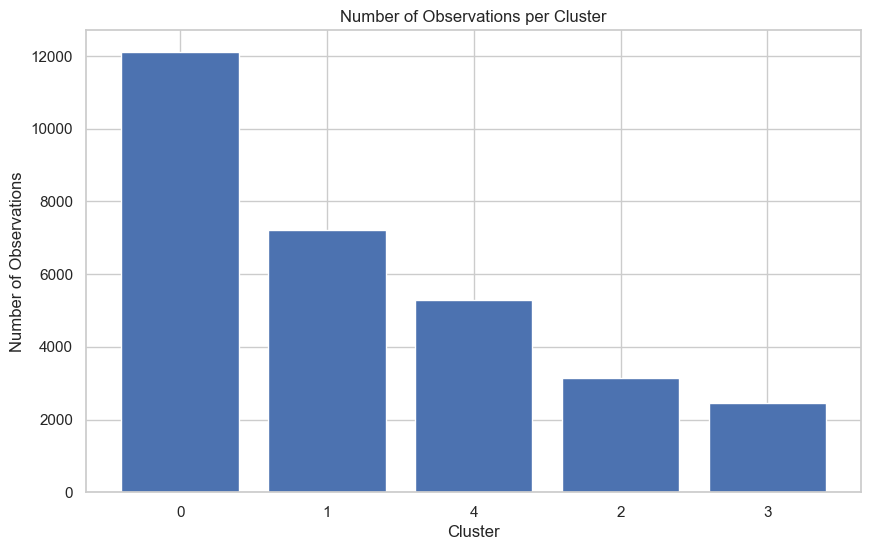

In [27]:
# Sort the clusters by count in descending order
sorted_clusters = sorted(cluster_counts.items(), key=lambda x: x[1], reverse=True)

# Extract sorted cluster labels and counts
sorted_cluster_ids = [item[0] for item in sorted_clusters]
sorted_counts = [item[1] for item in sorted_clusters]

# Plot bar chart for nº of obs per cluster
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_cluster_ids)), sorted_counts, tick_label=sorted_cluster_ids)
plt.xlabel('Cluster')
plt.ylabel('Number of Observations')
plt.title('Number of Observations per Cluster')
plt.show()

- After using K-means with k=5 and initial centroids defined as the centroids obtained from hierarchical clustering the final score is 0.427.
- In the context of client segmentation for a delivery service the imbalance might reflect real differences in customer behavior, it is normal that a big portion of clients has more common habits, while cluster 2 and 3 are smaller and can represent niche segments with more unique behaviors.

In [28]:
# Save cluster assignments on dataset 

df_preprocessed['Cluster'] = kmeans_labels  

<a class="anchor" id="clusterquality">

### 3.1.1. Cluster quality

</a>

**Silhouette plot:**

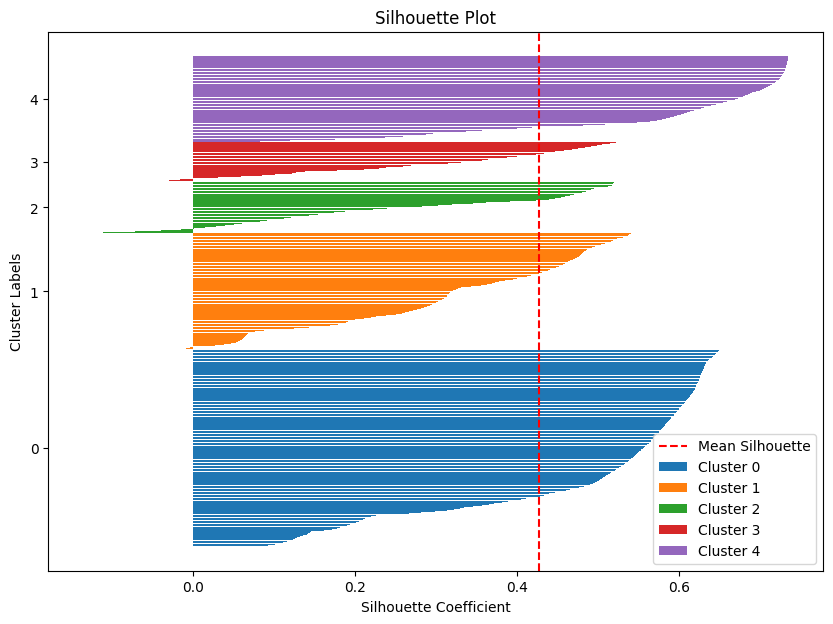

In [29]:
silhouette_vals = silhouette_samples(df_preprocessed[segmentation_features], df_preprocessed["Cluster"])

y_lower, y_upper = 0, 0
yticks = []  

plt.style.use('default') 
plt.figure(figsize=(10, 7))

for i, cluster in enumerate(np.unique(df_preprocessed["Cluster"])):

    cluster_silhouette_vals = silhouette_vals[df_preprocessed["Cluster"] == cluster]
    cluster_silhouette_vals.sort()
    cluster_size = len(cluster_silhouette_vals)
    y_upper += cluster_size
    
    plt.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor="none", label=f"Cluster {cluster}")
    
    yticks.append((y_lower + y_upper) / 2)
    
    y_lower += cluster_size

plt.title("Silhouette Plot")
plt.xlabel("Silhouette Coefficient")
plt.ylabel("Cluster Labels")
plt.yticks(yticks, np.unique(df_preprocessed["Cluster"]))
plt.axvline(x=np.mean(silhouette_vals), color="red", linestyle="--", label="Mean Silhouette")
plt.legend(loc="best")
plt.show()

- Clusters 0 (blue) and 4 (purple) have a significant majority of points with silhouette scores above 0.5, indicating that most points are well assigned. However, a small portion of points in these clusters exhibit lower scores, suggesting they may not be as strongly cohesive.
- Clusters 2 (green) and 3 (red) show approximately half of their points with silhouette scores above 0.4, while the remainder fall below the average silhouette score. Some points have values close to zero, indicating they are near the border with neighboring clusters. Additionally, there is a small number of points with negative silhouette scores, particularly in Cluster 2, which exhibits more pronounced negative values, suggesting potential misassignments.
- Cluster 1 (orange) has a considerable number of points with scores above the average silhouette of 0.4, but the majority remain below this threshold. A minority of points have scores close to zero, indicating they are near the border between clusters, while a very small subset exhibits low negative values, suggesting incorrect cluster assignments.
- Overall: Clusters 0 and 4 are the most well-formed clusters, followed by Cluster 1, which shows moderate cohesion. Clusters 3 and especially Cluster 2 exhibit more signs of potential misassignments, with Cluster 2 being the least cohesive due to its higher number of negative silhouette scores. Despite these issues, the majority of points across all clusters are well assigned, as reflected in the overall mean silhouette score of 0.43.

**Conclusions on evaluation:**
- The silhouette score of 0.43 suggests the most points are well assigned to clusters, while there may be some overlapping between clusters which lowers the score and can results in not very clear borders, additionally it's possible that there is a minor number of misassigned points.  
- The score indicates room for improvement but the clusters might still provide useful insights on customer segmentation with additional profiling features.

<a class="anchor" id="pcavisopt">

## 3.2. PCA and visualizations for optimization results

</a>

**PCA w/ 2 components:**

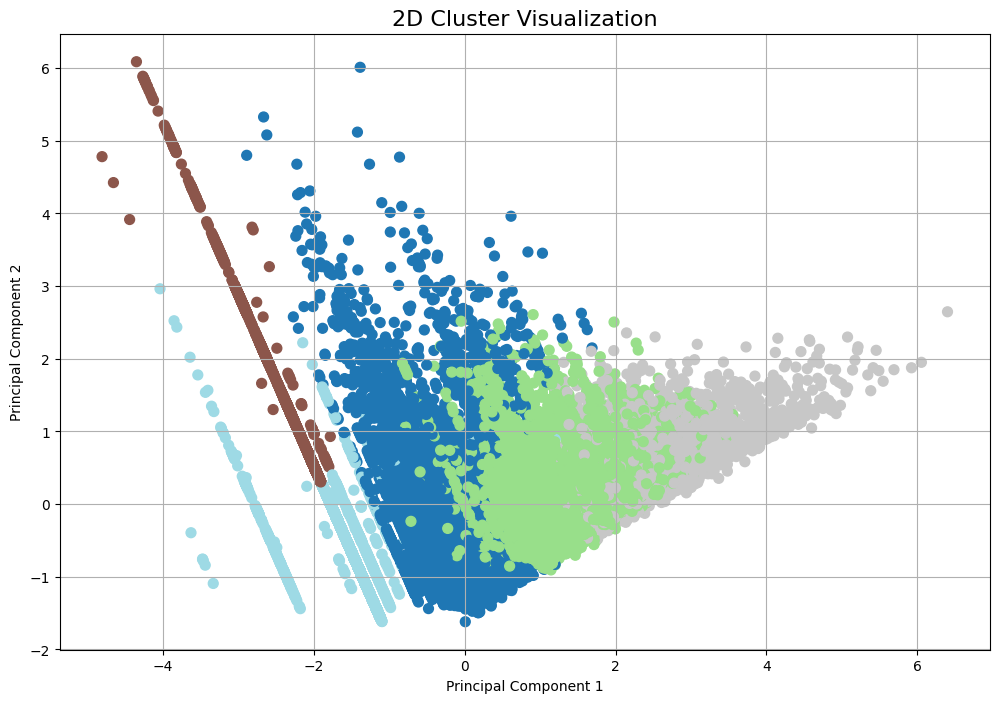

In [30]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    df_pca_with_labels["PC1"], 
    df_pca_with_labels["PC2"], 
    c=df_pca_with_labels["Cluster"], 
    cmap="tab20", 
    s=50
)

plt.title("2D Cluster Visualization", fontsize=16)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid(True)

plt.show()

- The clusters are more well defined, but still have overlapping points.

**PCA w/ 3 components:**

In [31]:
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_preprocessed[segmentation_features])
df_pca_with_labels = pd.DataFrame(df_pca, columns=["PC1", "PC2", "PC3"])
df_pca_with_labels["Cluster"] = kmeans_labels

In [32]:
loadings = pd.DataFrame(
    pca.components_.T, 
    columns=[f"PC{i+1}" for i in range(pca.n_components_)],
    index=segmentation_features
)

print("Principal Component Loadings:")
print(loadings)

Principal Component Loadings:
                          PC1       PC2       PC3
total_orders         0.566143  0.250811  0.151051
avg_spent_per_order -0.377247  0.892746 -0.243937
vendor_loyalty      -0.528921 -0.374245 -0.466769
order_frequency     -0.507356  0.006219  0.836543


- PC1: general components, mostly total orders and vendor loyalty.
- PC2: mostly related to average spent per order.
- PC3: mostly related to order frequency.

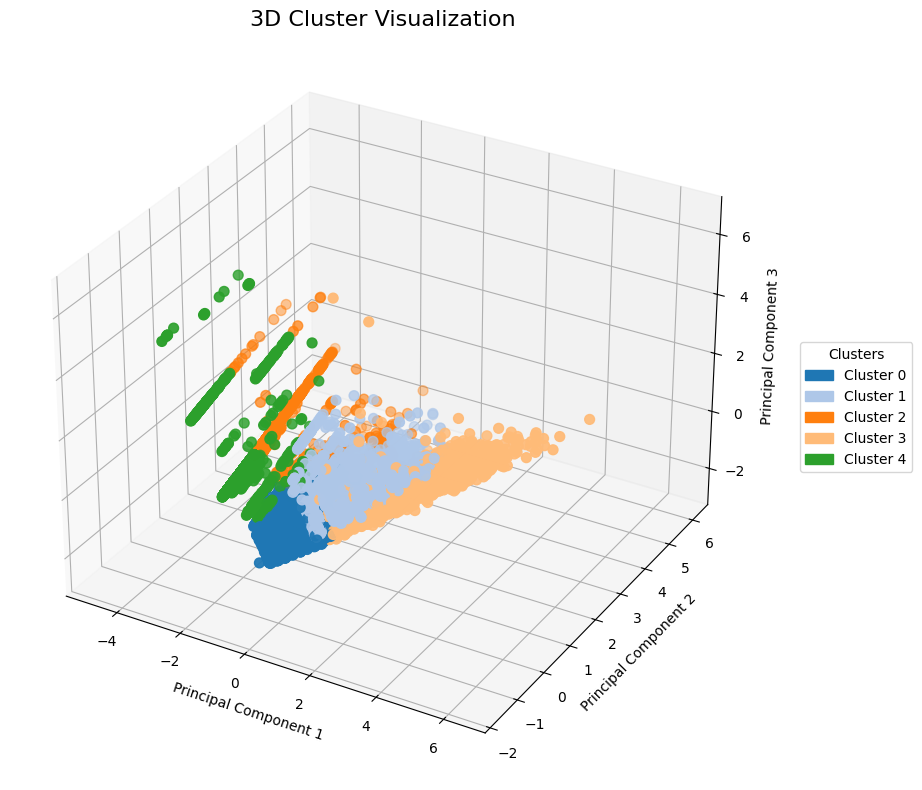

In [33]:
# 3D Cluster Visualization

unique_clusters = sorted(df_pca_with_labels["Cluster"].unique()) 
cluster_to_color = {cluster: plt.cm.tab20(i) for i, cluster in enumerate(unique_clusters)}

colors = df_pca_with_labels["Cluster"].map(cluster_to_color)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    df_pca_with_labels["PC1"], 
    df_pca_with_labels["PC2"], 
    df_pca_with_labels["PC3"], 
    c=colors, 
    s=50
)

legend_handles = [
    mpatches.Patch(color=cluster_to_color[cluster], label=f"Cluster {cluster}")
    for cluster in unique_clusters
]

ax.legend(
    handles=legend_handles, 
    title="Clusters", 
    loc="center left", 
    bbox_to_anchor=(1.05, 0.5), 
    fontsize=10
)

ax.set_title("3D Cluster Visualization", fontsize=16)
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")

plt.tight_layout()
plt.show()

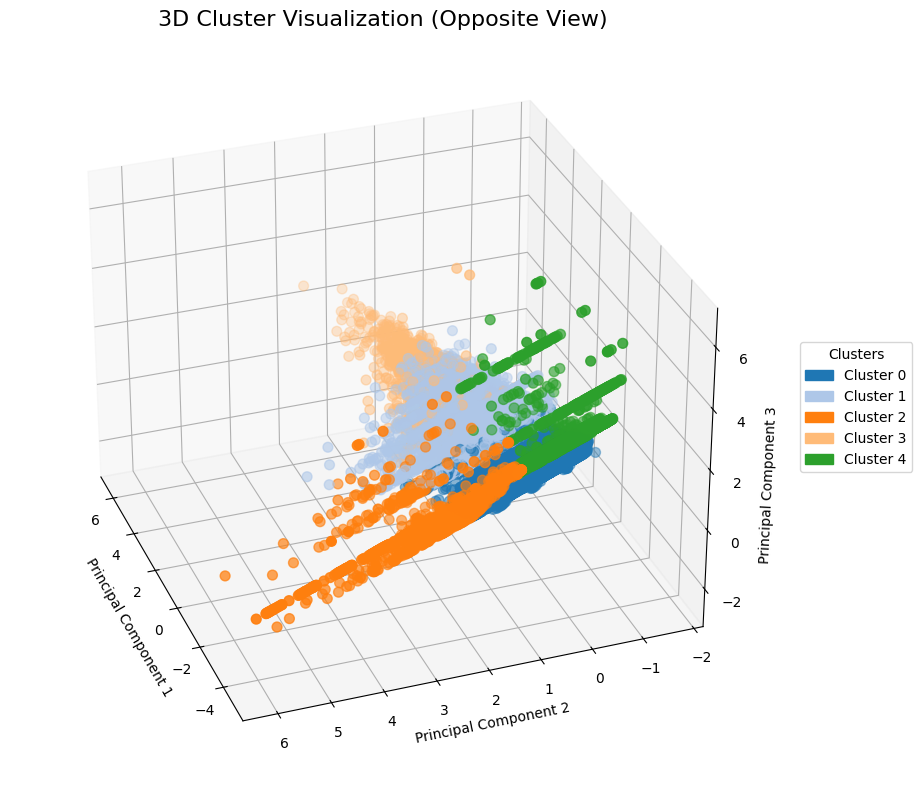

In [34]:
# 3D Cluster Visualization

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    df_pca_with_labels["PC1"], 
    df_pca_with_labels["PC2"], 
    df_pca_with_labels["PC3"], 
    c=df_pca_with_labels["Cluster"].map(cluster_to_color), 
    s=50
)

ax.view_init(elev=30, azim=-200)  


legend_handles = [
    mpatches.Patch(color=cluster_to_color[cluster], label=f"Cluster {cluster}")
    for cluster in unique_clusters
]

ax.legend(
    handles=legend_handles, 
    title="Clusters", 
    loc="center left", 
    bbox_to_anchor=(1.05, 0.5), 
    fontsize=10
)

ax.set_title("3D Cluster Visualization (Opposite View)", fontsize=16)
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")

plt.tight_layout()
plt.show()


In [38]:
# 3D Cluster Visualization
unique_clusters = sorted(df_pca_with_labels["Cluster"].unique()) 

fig = px.scatter_3d(
    df_pca_with_labels,
    x='PC1',
    y='PC2',
    z='PC3',
    color="Cluster",
    title="Interactive 3D Cluster Visualization",
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'},
    opacity=0.9,
)

# Adjust the layout size
fig.update_layout(
    height=900, 
    width=1200   
)

plt.tight_layout()
fig.show()

<Figure size 640x480 with 0 Axes>

- The results of the visualization align with our earlier silhouette plot and score analysis, confirming the clusters' overall satisfactory cohesion but with some areas of overlap and potential misassignments.

<a class="anchor" id="outliers">

## 3.3. Outliers

</a>

In [39]:
# map cluster labels to real values in the original dataset 

df['Cluster'] = df_preprocessed['Cluster']

In [40]:
# The outliers that were removed during the preprocessing should be assigned to cluster -1 

outlier_indices = df.index.difference(df_preprocessed.index)

df.loc[outlier_indices, 'Cluster'] = -1

<a class="anchor" id="segfeat">

## 3.4. Segmentation features importance

</a>

In [41]:
# Get centroids
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=segmentation_features)

# Check the feature with the largest range across centroids
print("\nFeature Importance - Range Across Centroids:")
feature_importance = centroids.max() - centroids.min()
print(feature_importance.sort_values(ascending=False))


Feature Importance - Range Across Centroids:
total_orders           3.383953
avg_spent_per_order    2.602254
order_frequency        2.215463
vendor_loyalty         1.980547
dtype: float64


- This is an indicative of how much the features differenciate clusters. 
- total_orders varies significantly between clusters and is more important for differentiating the clusters than the others, clusters are more distinct because of total_orders.
- Followed by avg_spent_per_order and order_frequency, which also have a significant rule in cluster separation.
- vendor_loyalty has the the lowest range, meaning it has less effect in distinguishing clusters, but it is not much lower than avg_spent_per_order and vendor_loyalty.

In [42]:
baseline_score = silhouette_score(df_preprocessed[segmentation_features], kmeans.labels_)

# Feature importance via permutation
importance = {}
for feature in df_preprocessed[segmentation_features]:
    shuffled_data = df_preprocessed[segmentation_features].copy()
    # The feature values are shuffle across clusters
    shuffled_data[feature] = np.random.permutation(shuffled_data[feature])
    # Score after shuffling, features connection with clusters is broken
    shuffled_score = silhouette_score(shuffled_data, kmeans.labels_)
    # Diference between inicial score and score after shuffling
    importance[feature] = baseline_score - shuffled_score

importance = pd.Series(importance).sort_values(ascending=False)
print("Feature Importance - Permutation:")
print(importance)


Feature Importance - Permutation:
vendor_loyalty         0.295637
order_frequency        0.292172
total_orders           0.182374
avg_spent_per_order    0.172124
dtype: float64


- The feature with biggest impact in cluster formation are feature are vendor_loyalty and order_frequency.
- total_orders and avg_spent_per_order also cause a big reductioon of score, which indicates they are have a big impact even if it's lower then the previously mentioned features.
- All features appear to have a big impact, indicating they are all relevant.

In [43]:
# Kruskal-Wallis Test

for feature in df_preprocessed[segmentation_features]:
    clusters = df_preprocessed["Cluster"].unique()
    cluster_data = [df_preprocessed[df_preprocessed["Cluster"] == c][feature] for c in clusters]
    stat, p_value = kruskal(*cluster_data)
    print(f"Kruskal-Wallis for {feature}: H-statistic = {stat}, p-value = {p_value}")

Kruskal-Wallis for total_orders: H-statistic = 19809.19586113348, p-value = 0.0
Kruskal-Wallis for avg_spent_per_order: H-statistic = 8407.799232144514, p-value = 0.0
Kruskal-Wallis for vendor_loyalty: H-statistic = 25036.341192398617, p-value = 0.0
Kruskal-Wallis for order_frequency: H-statistic = 17234.28681253234, p-value = 0.0


- Kruskal-Wallis Test does not assume normal distribution and allows to compare the medians of the segmentation feature across clusters.
- The p-values (=0) indicate there are highly significant differences across clusters medians for all features.
- H-statistic measures the extent of differences

In [44]:
# Post Hoc - Dunn's Test

for feature in df_preprocessed[segmentation_features]:
    dunn_results = sp.posthoc_dunn(df_preprocessed, val_col="total_orders", group_col="Cluster", p_adjust='bonferroni')
    print(f"post hoc Dunn's test results for {feature}:")
    print(dunn_results)

post hoc Dunn's test results for total_orders:
               0              1             2    3             4
0   1.000000e+00  4.407366e-133  0.000000e+00  0.0  0.000000e+00
1  4.407366e-133   1.000000e+00  0.000000e+00  0.0  0.000000e+00
2   0.000000e+00   0.000000e+00  1.000000e+00  0.0  2.004401e-14
3   0.000000e+00   0.000000e+00  0.000000e+00  1.0  0.000000e+00
4   0.000000e+00   0.000000e+00  2.004401e-14  0.0  1.000000e+00
post hoc Dunn's test results for avg_spent_per_order:
               0              1             2    3             4
0   1.000000e+00  4.407366e-133  0.000000e+00  0.0  0.000000e+00
1  4.407366e-133   1.000000e+00  0.000000e+00  0.0  0.000000e+00
2   0.000000e+00   0.000000e+00  1.000000e+00  0.0  2.004401e-14
3   0.000000e+00   0.000000e+00  0.000000e+00  1.0  0.000000e+00
4   0.000000e+00   0.000000e+00  2.004401e-14  0.0  1.000000e+00
post hoc Dunn's test results for vendor_loyalty:
               0              1             2    3             4
0   1

- Pairwise comparisons: All p-values are very small meaning that every pair of clusters has significantly different distributions between each other for all the tested features.

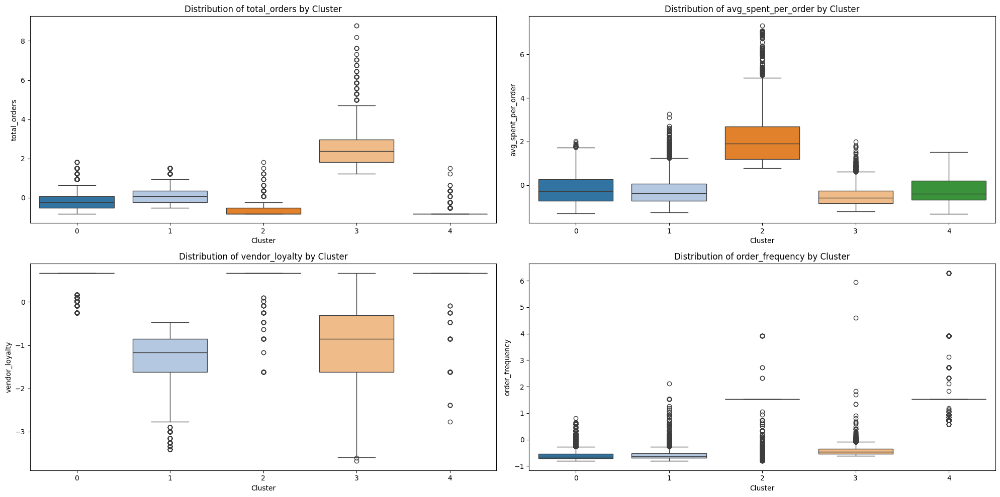

In [45]:
num_features = len(segmentation_features)
cols = 2
rows = (num_features + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()

for i, feature in enumerate(segmentation_features):
    sns.boxplot(data=df_preprocessed, x='Cluster', y=feature, ax=axes[i], palette=palette)
    axes[i].set_title(f'Distribution of {feature} by Cluster')
    axes[i].set_facecolor('white')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

**With outlier cluster and real values:**

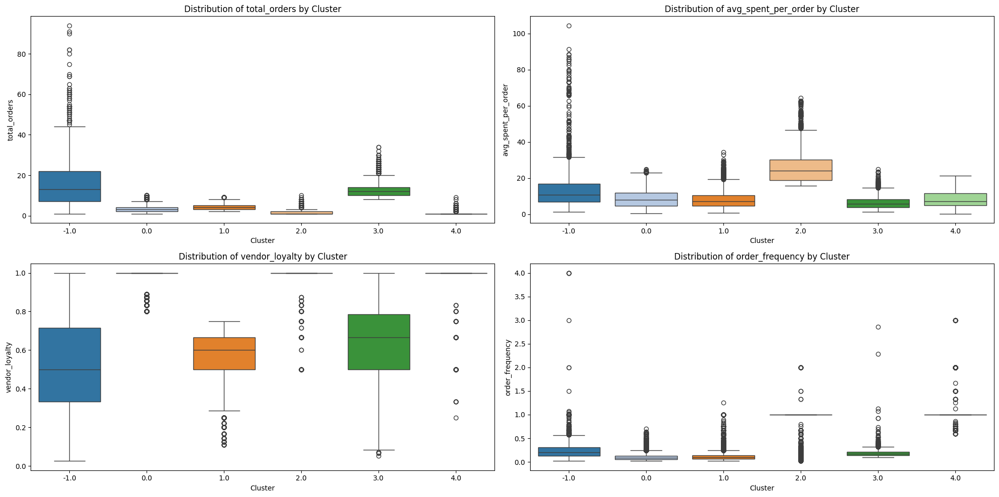

In [46]:
num_features = len(segmentation_features)
cols = 2
rows = (num_features + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()

for i, feature in enumerate(segmentation_features):
    sns.boxplot(data=df, x='Cluster', y=feature, ax=axes[i], palette=palette)
    axes[i].set_title(f'Distribution of {feature} by Cluster')
    axes[i].set_facecolor('white')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

|   Cluster   | total orders | avg spent per order | vendor loyalty | order frequency |
|-------------|--------------|---------------------|----------------|-----------------|
|      0      | Medium       | Medium              | Very high      | Low             |
|      1      | Medium       | Medium              | Low to medium  | Low             |
|      2      | Low          | High                | Very high      | High            |
|      3      | High         | Low to medium       | Medium         | Medium          |
|      4      | Very Low     | Medium              | Very High      | High            |
|      -1     | Wide range   | Wide range          | Wide range     | Wide range      |

- All clusters exhibit variation in at least one feature, with most clusters differing across multiple features.

<a class="anchor" id="profiling">

# **4. Profiling**

</a>

In [47]:
# Retrieve metric (numerical) features
metric_features = df.select_dtypes(include=[np.number]).columns.tolist()

# Retrieve non-metric features
non_metric_features = df.select_dtypes(exclude=[np.number]).columns.tolist()

print("Metric Features:", metric_features)
print("Non-Metric Features:", non_metric_features)

Metric Features: ['customer_age', 'vendor_count', 'product_count', 'is_chain', 'first_order', 'last_order', 'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'weekend_orders', 'weekdays_orders', 'total_orders', 'proportion_weekend', 'proportion_weekdays', 'breakfast', 'lunch', 'snack', 'dinner', 'late_night', 'proportion_breakfast', 'proportion_lunch', 'proportion_snack', 'proportion_dinner', 'proportion_late_night', 'total_spent', 'avg_spent_per_order', 'avg_products_per_order', 'avg_price_per_product', 'recency', 'active_period', 'order_frequency', 'cuisine_diversity', 'vendor_loyalty', 'Cluster']
Non-Metric Features: ['customer_region', 'last_promo', 'payment_method', 'age_group', 'use_promo', 'weekend_preference', 'meal_time_preference', 'cuisine_preference']


In [48]:
metric_features_analysis = ['vendor_count', 'product_count', 'is_chain', 'first_order', 'last_order', 
                            'weekend_orders', 'weekdays_orders', 'breakfast', 'lunch', 'snack', 'dinner', 
                            'late_night', 'total_orders', 'total_spent', 'avg_spent_per_order', 
                            'avg_products_per_order', 'avg_price_per_product', 'recency', 'active_period', 
                            'order_frequency', 'cuisine_diversity', 'vendor_loyalty',
                            'proportion_weekend', 'proportion_weekdays', 'proportion_breakfast', 
                            'proportion_lunch', 'proportion_snack', 'proportion_dinner', 'proportion_late_night']

<a class="anchor" id="numfeatures">

## 4.1. Numeric Features

</a>

In [49]:
# Calculate medians and means for features across clusters
median_by_feature = df[metric_features_analysis].groupby(df['Cluster']).median()
mean_by_feature = df[metric_features_analysis].groupby(df['Cluster']).mean()

<a class="anchor" id="groupedbarcharts">

### 4.1.1. Grouped bar charts

</a>

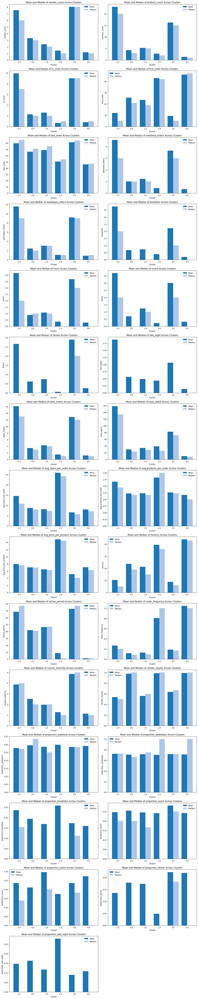

In [50]:
num_features = len(metric_features_analysis)

cols = 2
rows = (num_features + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows)) 
axes = axes.flatten() 

for i, feature in enumerate(metric_features_analysis):
    ax = axes[i]

    x = np.arange(len(mean_by_feature.index))

    bar_width = 0.4

    ax.bar(x - bar_width / 2, mean_by_feature[feature], width=bar_width, color=palette[0], label='Mean')
    ax.bar(x + bar_width / 2, median_by_feature[feature], width=bar_width, color=palette[1], label='Median')

    ax.set_title(f'Mean and Median of {feature} Across Clusters')
    ax.set_xlabel('Cluster')
    ax.set_ylabel(feature)
    ax.set_xticks(x)
    ax.set_xticklabels(mean_by_feature.index)
    ax.set_facecolor('white')
    ax.legend()

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

<a class="anchor" id="boxplots">

### 4.1.2. Boxplots

</a>

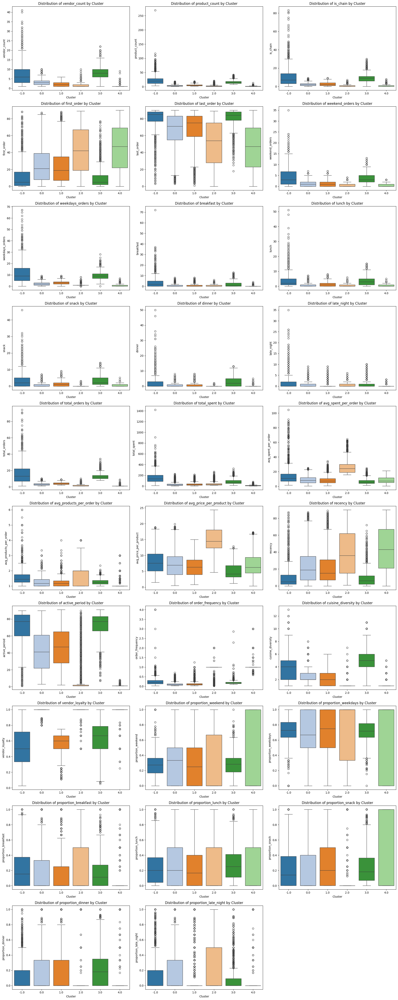

In [61]:
num_features = len(metric_features_analysis)
cols = 3 
rows = (num_features + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()

for i, feature in enumerate(metric_features_analysis):
    sns.boxplot(data=df, x='Cluster', y=feature, ax=axes[i], palette=palette)
    axes[i].set_title(f'Distribution of {feature} by Cluster')
    axes[i].set_facecolor('white')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

<a class="anchor" id="heatmapsmedian">

### 4.1.3. Heatmaps median and mean

</a>

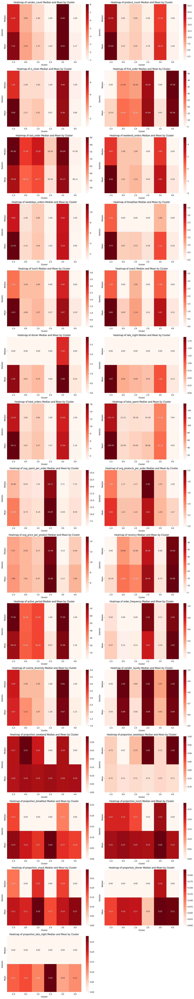

In [52]:
n_cols = 2
n_rows = -(-len(metric_features_analysis) // n_cols) 

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for idx, feature in enumerate(metric_features_analysis):
    combined_data = pd.DataFrame({
        'Median': median_by_feature[feature].astype(float),
        'Mean': mean_by_feature[feature].astype(float)
    }).T

    combined_data = combined_data.apply(pd.to_numeric, errors='coerce')

    sns.heatmap(
        combined_data,
        annot=True,
        fmt=".2f",
        cmap="Reds",
        cbar=True,
        ax=axes[idx]
    )
    axes[idx].set_title(f"Heatmap of {feature} Median and Mean by Cluster")
    axes[idx].set_xlabel("Cluster")
    axes[idx].set_ylabel("Statistic")

for ax in axes[len(metric_features_analysis):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


In [53]:
overall_mean = df[metric_features_analysis].mean()

cluster_means = df[df['Cluster'].isin([0, 1, 2, 3, 4])].groupby('Cluster')[metric_features_analysis].mean()

final_table = pd.concat([overall_mean.rename('Overall Mean'), cluster_means.T], axis=1)

def highlight_extremes(s):
    is_max = s == s.max()
    is_min = s == s.min()
    return ['background-color: lightgreen' if v else
            'background-color: lightcoral' if w else '' 
            for v, w in zip(is_max, is_min)]


def bold_overall_and_features(data):
    styles = pd.DataFrame('', index=data.index, columns=data.columns)
    styles.iloc[:, 0] = 'font-weight: bold;' 
    styles.loc[:, 'Overall Mean'] = 'font-weight: bold;' 
    return styles

styled_table = (final_table.style
                .apply(highlight_extremes, axis=1)
                .apply(bold_overall_and_features, axis=None))


styled_table

,Overall Mean,0.000000,1.000000,2.000000,3.000000,4.000000
vendor_count,3.116205,3.300752,2.373215,1.423383,8.023208,1.167925
product_count,5.693638,4.265802,5.252877,2.785919,16.227199,1.400566
is_chain,2.829253,2.269768,2.606960,0.672826,8.978420,0.800943
first_order,28.304440,25.540858,23.513656,42.893278,9.407980,45.937547
last_order,63.755049,66.351070,68.773742,50.560370,81.271580,46.113774
weekend_orders,1.265810,1.009419,1.225149,0.437719,3.649430,0.342642
weekdays_orders,3.122223,2.413864,3.044087,1.029627,9.185668,0.850377
breakfast,0.845417,0.673387,0.730071,0.394075,2.208469,0.197736
lunch,1.149605,0.884078,1.071260,0.366359,3.674267,0.292642
snack,1.029209,0.691481,1.236933,0.217904,3.006107,0.315849


<a class="anchor" id="scatterplots">

### 4.1.4. Scatter plots - pairwise by cluster

</a>

In [54]:
specific_pairs = [
    ('total_spent', 'total_orders'),
    ('total_orders', 'vendor_loyalty'),
    ('avg_spent_per_order', 'avg_products_per_order'),
    ('avg_spent_per_order', 'avg_price_per_product'),
    ('avg_products_per_order', 'avg_price_per_product'),
    ('avg_spent_per_order', 'active_period'),
    ('order_frequency', 'active_period'),
    ('vendor_loyalty', 'active_period'),
    ('vendor_loyalty', 'cuisine_diversity'),
    ('recency', 'cuisine_diversity'),
    ('recency', 'vendor_loyalty'),
    ('recency', 'avg_spent_per_order'),
    ('recency', 'avg_products_per_order'),
    ('proportion_weekend', 'proportion_dinner'),
    ('proportion_weekdays', 'proportion_lunch'),
    ('cuisine_diversity', 'avg_spent_per_order')
]

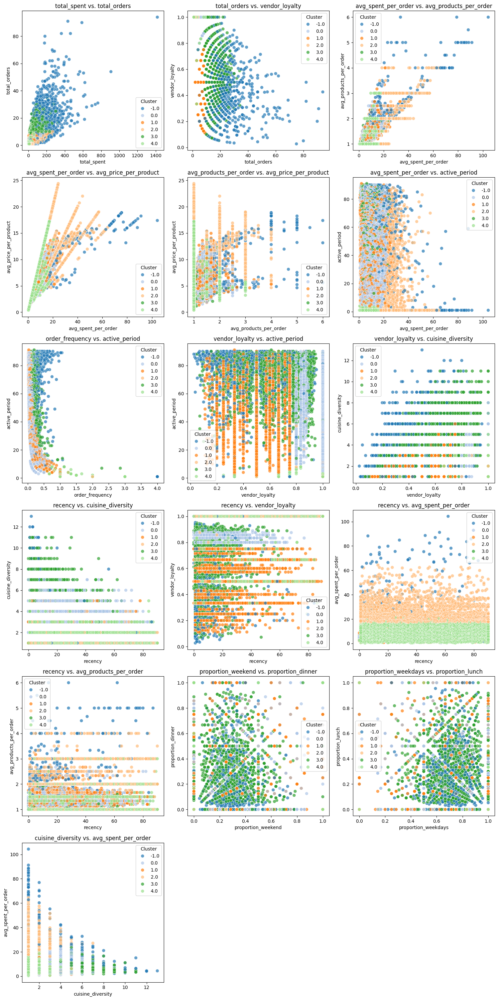

In [55]:
n_cols = 3
n_rows = -(-len(specific_pairs) // n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for idx, (x, y) in enumerate(specific_pairs):
    sns.scatterplot(
        data=df, x=x, y=y, hue='Cluster', palette=palette, alpha=0.7, s=50, ax=axes[idx]
    )
    axes[idx].set_title(f'{x} vs. {y}')
    axes[idx].set_xlabel(x)
    axes[idx].set_ylabel(y)
    axes[idx].legend(title="Cluster", loc='best')
    axes[idx].set_facecolor('white')

for ax in axes[len(specific_pairs):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

<a class="anchor" id="catfeatures">

## 4.2. Categoric Features

</a>

In [56]:
# Calculate relative frequencies for all non-metric features
relative_frequency = {}

for feature in non_metric_features:
    rel_freq = df.groupby('Cluster')[feature].value_counts(normalize=True).mul(100)
    relative_frequency[feature] = rel_freq.unstack(fill_value=0) 

<a class="anchor" id="stackedbarplot">

### 4.2.1. Stacked bar plot

</a>

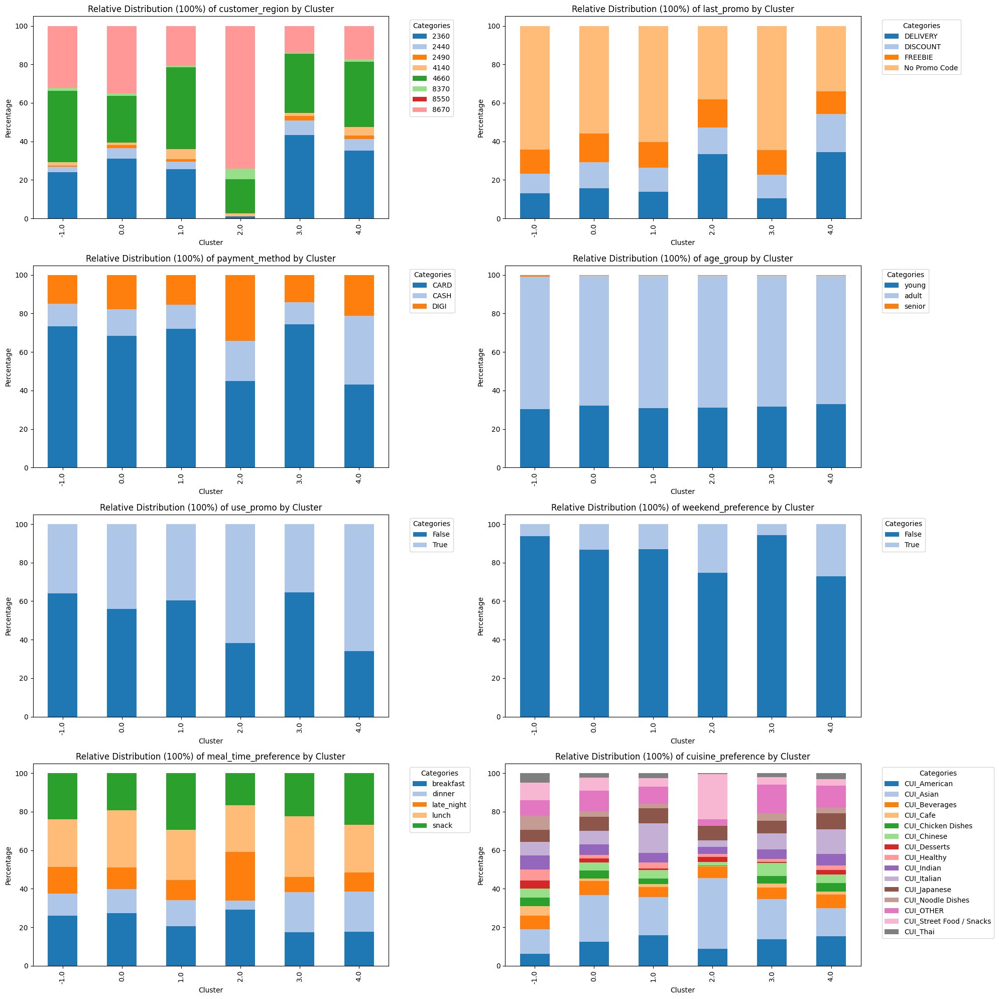

In [57]:
cols = 2
rows = (len(relative_frequency) + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()

for i, (feature, rel_freq_df) in enumerate(relative_frequency.items()):
    rel_freq_df.plot(
        kind='bar',
        stacked=True,
        ax=axes[i],
        color=palette,
    )
    axes[i].set_facecolor('white')  
    axes[i].set_title(f'Relative Distribution (100%) of {feature} by Cluster')
    axes[i].set_xlabel('Cluster')
    axes[i].set_ylabel('Percentage')
    axes[i].legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


<a class="anchor" id="heatmaprelfreq">

### 4.2.2. Heatmaps relative frequency

</a>

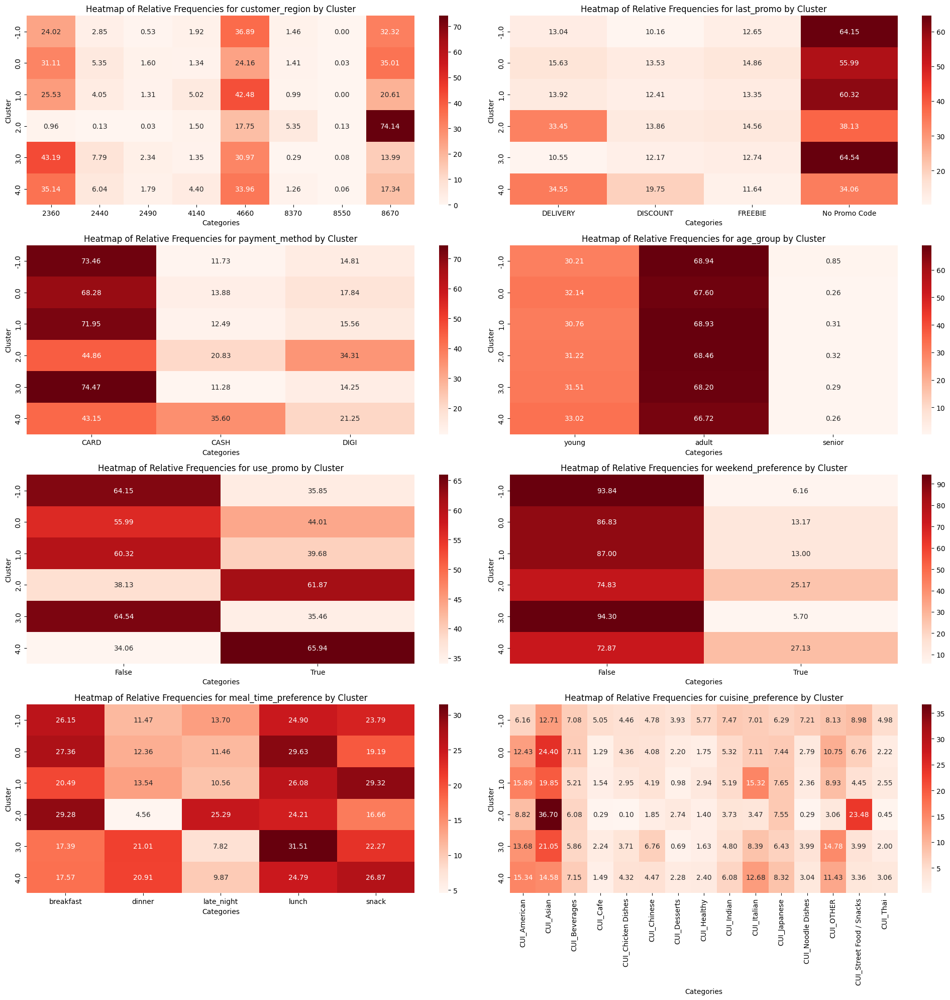

In [58]:
cols = 2
rows = (len(relative_frequency) + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()

for i, (feature, rel_freq_df) in enumerate(relative_frequency.items()):
    sns.heatmap(
        rel_freq_df,
        annot=True,
        fmt=".2f",
        cmap="Reds",
        cbar=True,
        ax=axes[i]
    )
    axes[i].set_title(f"Heatmap of Relative Frequencies for {feature} by Cluster")
    axes[i].set_xlabel("Categories")
    axes[i].set_ylabel("Cluster")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()